In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import os
import pyregion
from spectral_cube import SpectralCube
from astropy.visualization import simple_norm
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import astropy.units as u
from astroquery.simbad import Simbad
matplotlib.rcParams['ps.useafm'] = True
matplotlib.rcParams['pdf.use14corefonts'] = True
matplotlib.rcParams['text.usetex'] = True

In [2]:
def plot_moment_maps(cube, SourceName, base_path='/home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2'):
    """
    Generate and plot moment maps for the given SpectralCube.
    
    Parameters:
    cube (SpectralCube): A SpectralCube object to generate moment maps from.
    SourceName (str): Name of the source to be used in the filename and directory.
    base_path (str): Base directory path where the plot will be saved.
    """
    # Calculate moment maps
    moment0 = cube.moment(order=0)
    moment1 = cube.moment(order=1)
    moment2 = cube.moment(order=2)

    #moment2 = moment2 / 1000

    # Get RA and DEC values in degrees
    header = cube.header
    ra_deg = get_pixel_locations(header, axis=1)
    dec_deg = get_pixel_locations(header, axis=2)

    # Create a figure with 1 row and 3 columns
    fig, axes = plt.subplots(1, 3, figsize=(20.5, 6))  # Increase figure size for larger images

    # Plot Moment 0
    norm0 = simple_norm(moment0, 'sqrt', percent=85)
    im0 = axes[0].imshow(moment0.value, origin='lower', cmap='jet', norm=norm0, extent=[ra_deg[0].value, ra_deg[-1].value, dec_deg[0].value, dec_deg[-1].value])
    axes[0].set_title('Moment 0: Integrated Intensity', fontsize=16)
    axes[0].set_xlabel('RA (degrees)', fontsize=14)
    axes[0].set_ylabel('Dec (degrees)', fontsize=14)
    axes[0].tick_params(axis='both', labelsize=14)
    cbar0 = fig.colorbar(im0, ax=axes[0])  # Adjust colorbar size
    cbar0.ax.tick_params(labelsize=12)  # Increase font size of colorbar ticks
    cbar0.set_label('Moment 0 (Jy/beam.km/s)', fontsize=12) 

    # Add SourceName text to the upper left of Moment 0 plot
    axes[0].text(0.02, 0.98, SourceName, transform=axes[0].transAxes, 
                 fontsize=14, verticalalignment='top', horizontalalignment='left', 
                 bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

    # Plot Moment 1
    norm1 = simple_norm(moment1, 'sqrt', percent=85)
    im1 = axes[1].imshow(moment1.value, origin='lower', cmap='cividis', norm=norm1, extent=[ra_deg[0].value, ra_deg[-1].value, dec_deg[0].value, dec_deg[-1].value])
    axes[1].set_title('Moment 1: Intensity-weighted Velocity', fontsize=16)
    axes[1].set_xlabel('RA (degrees)', fontsize=14)
    axes[1].set_ylabel('Dec (degrees)', fontsize=14)
    axes[1].tick_params(axis='both', labelsize=14)
    cbar1 = fig.colorbar(im1, ax=axes[1])  # Adjust colorbar size
    cbar1.ax.tick_params(labelsize=12)  # Increase font size of colorbar ticks
    cbar1.set_label('Moment 1 (km/s)', fontsize=12) 

    # Plot Moment 2
    norm2 = simple_norm(moment2, 'sqrt', percent=85)
    im2 = axes[2].imshow(moment2.value, origin='lower', cmap='gist_rainbow', norm=norm2, extent=[ra_deg[0].value, ra_deg[-1].value, dec_deg[0].value, dec_deg[-1].value])
    axes[2].set_title('Moment 2: Velocity Dispersion', fontsize=16)
    axes[2].set_xlabel('RA (degrees)', fontsize=14)
    axes[2].set_ylabel('Dec (degrees)', fontsize=14)
    axes[2].tick_params(axis='both', labelsize=14)
    cbar2 = fig.colorbar(im2, ax=axes[2])  # Adjust colorbar size
    cbar2.ax.tick_params(labelsize=12)  # Increase font size of colorbar ticks
    cbar2.set_label('Moment 2 (km$^2$/s$^2$)', fontsize=12) 

    plt.tight_layout()

    # Construct save path
    save_dir = base_path
    os.makedirs(save_dir, exist_ok=True)  # Create directory if it doesn't exist
    save_file = os.path.join(save_dir, f'{SourceName}_moment_maps.pdf')

    # Save or show plot
    plt.savefig(save_file, bbox_inches='tight')  # Save plot to specified path
    print(f"Plot saved to {save_file}")
    plt.show()  # Display plot


def get_pixel_locations(header, axis):
    """
    Get a list of pixel locations for a given image and axis from a header.

    Parameters
    ----------
    header : astropy.io.fits.Header
        Header object from a FITS file.
    axis : int
        Axis number. No default.

    Returns
    -------
    astropy.units.Quantity
        Array of coordinates along the axis in the units of the header (e.g., degrees for a RA or DEC axis).
    """

    crpix = header['CRPIX' + str(axis)] * u.pix
    crval = u.Quantity(header['CRVAL' + str(axis)]) * u.Unit(header['CUNIT' + str(axis)])
    cdelt = u.Quantity(header['CDELT' + str(axis)]) * u.Unit(header['CUNIT' + str(axis)]) / u.pix
    naxis = header['NAXIS' + str(axis)]

    return (np.arange(naxis) * u.pix - crpix) * cdelt + crval

# I14498 CO

/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:178: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * (pix_cen - mom1) ** order, axis=axis) /


Plot saved to /home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2/IRAS 14498-5856 CO_moment_maps.pdf


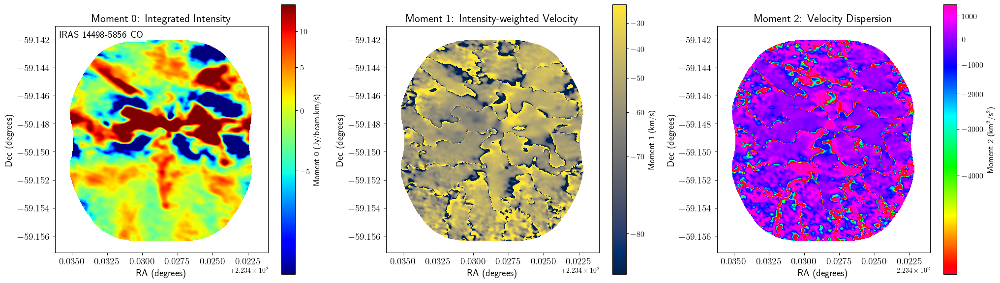

/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:178: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * (pix_cen - mom1) ** order, axis=axis) /


Plot saved to /home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2/IRAS 14498-5856 CO (blue)_moment_maps.pdf


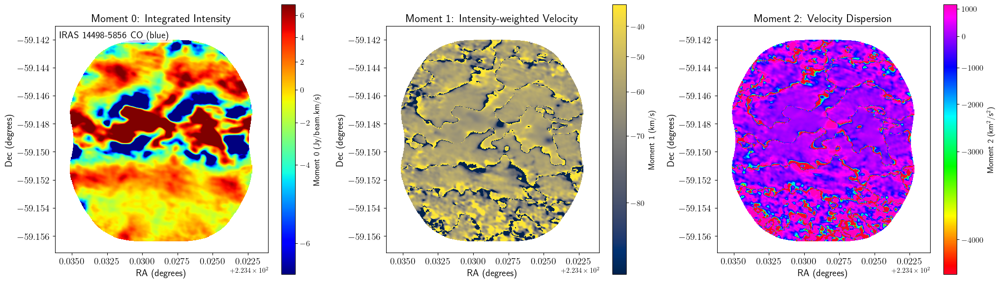

/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:178: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * (pix_cen - mom1) ** order, axis=axis) /


Plot saved to /home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2/IRAS 14498-5856 CO (red)_moment_maps.pdf


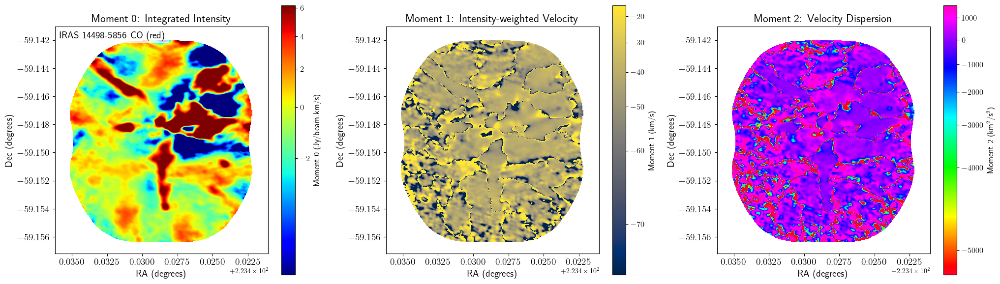

In [3]:
cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/IRAS 14498-5856 _CO_/IRAS 14498-5856 _CO__spectral_axis_vel.fits')
SourceName = 'IRAS 14498-5856 CO'
plot_moment_maps(cube, SourceName)

cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/IRAS 14498-5856 _CO_/IRAS 14498-5856 _CO__blue.fits')
SourceName = 'IRAS 14498-5856 CO (blue)'
plot_moment_maps(cube, SourceName)

cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/IRAS 14498-5856 _CO_/IRAS 14498-5856 _CO__red.fits')
SourceName = 'IRAS 14498-5856 CO (red)'
plot_moment_maps(cube, SourceName)

# I16060 CO

/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:178: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * (pix_cen - mom1) ** order, axis=axis) /


Plot saved to /home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2/IRAS 16060-5146 CO_moment_maps.pdf


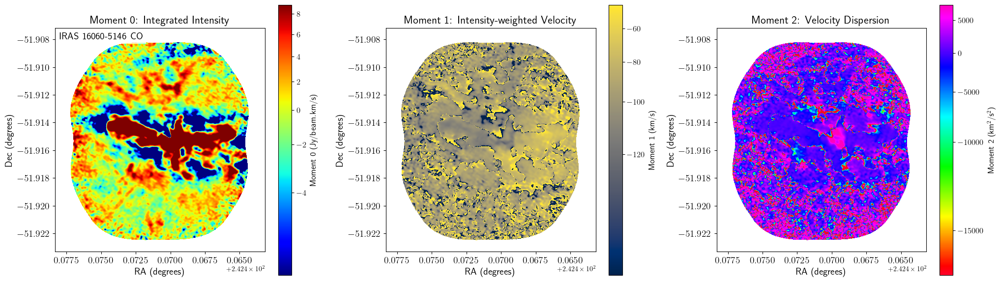

/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:178: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * (pix_cen - mom1) ** order, axis=axis) /


Plot saved to /home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2/IRAS 16060-5146 CO (blue)_moment_maps.pdf


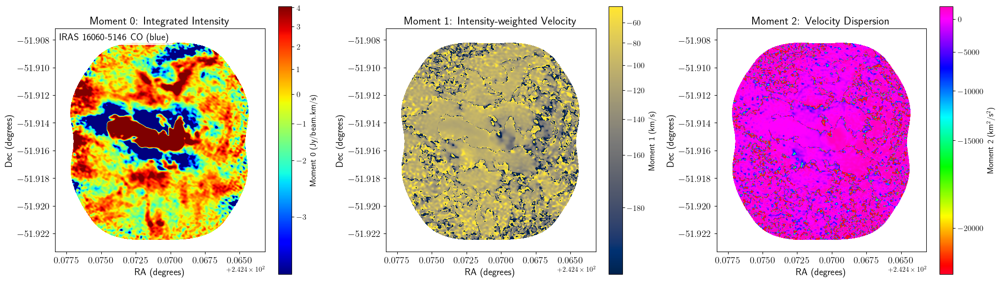

/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:178: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * (pix_cen - mom1) ** order, axis=axis) /


Plot saved to /home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2/IRAS 16060-5146 CO (red)_moment_maps.pdf


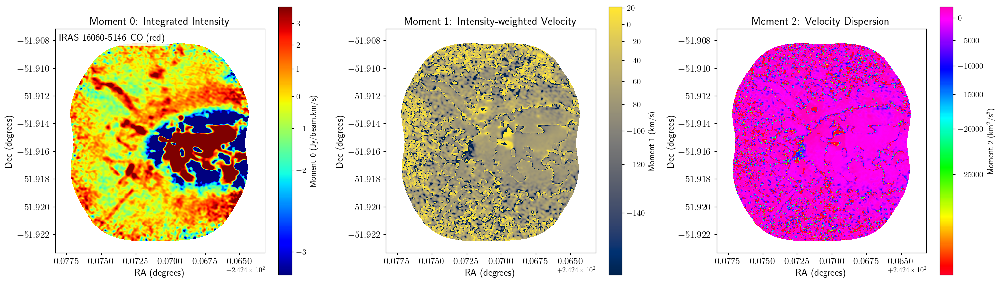

In [4]:
cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/IRAS 16060-5146 _CO_/IRAS 16060-5146 _CO__spectral_axis_vel.fits')
SourceName = 'IRAS 16060-5146 CO'
plot_moment_maps(cube, SourceName)

cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/IRAS 16060-5146 _CO_/IRAS 16060-5146 _CO__blue.fits')
SourceName = 'IRAS 16060-5146 CO (blue)'
plot_moment_maps(cube, SourceName)

cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/IRAS 16060-5146 _CO_/IRAS 16060-5146 _CO__red.fits')
SourceName = 'IRAS 16060-5146 CO (red)'
plot_moment_maps(cube, SourceName)

# I16272 CO

/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:178: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * (pix_cen - mom1) ** order, axis=axis) /


Plot saved to /home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2/IRAS 16272-4837 CO_moment_maps.pdf


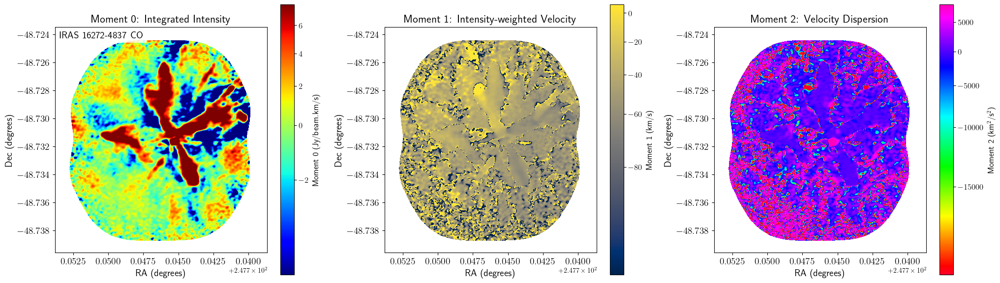

/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:178: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * (pix_cen - mom1) ** order, axis=axis) /


Plot saved to /home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2/IRAS 16272-4837 CO (blue)_moment_maps.pdf


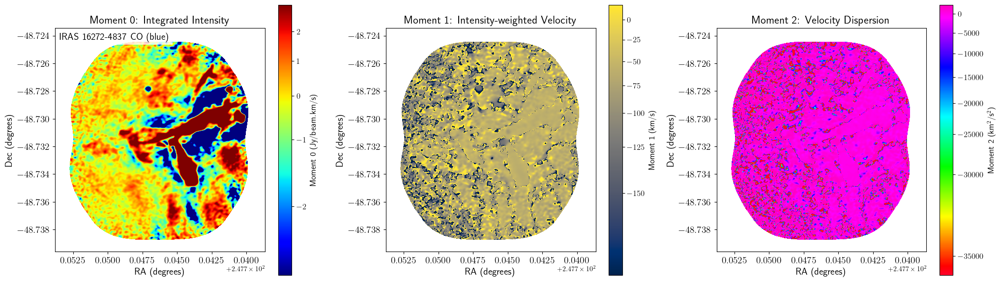

/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:178: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * (pix_cen - mom1) ** order, axis=axis) /


Plot saved to /home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2/IRAS 16272-4837 CO (red)_moment_maps.pdf


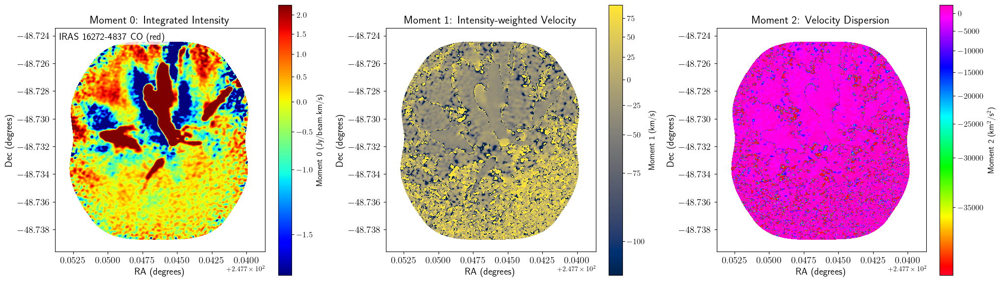

In [5]:
cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/IRAS 16272-4837 _CO_/IRAS 16272-4837 _CO__spectral_axis_vel.fits')
SourceName = 'IRAS 16272-4837 CO'
plot_moment_maps(cube, SourceName)

cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/IRAS 16272-4837 _CO_/IRAS 16272-4837 _CO__blue.fits')
SourceName = 'IRAS 16272-4837 CO (blue)'
plot_moment_maps(cube, SourceName)

cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/IRAS 16272-4837 _CO_/IRAS 16272-4837 _CO__red.fits')
SourceName = 'IRAS 16272-4837 CO (red)'
plot_moment_maps(cube, SourceName)

# I14498 HCO+ (1-0)

/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:178: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * (pix_cen - mom1) ** order, axis=axis) /


Plot saved to /home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2/IRAS 14498-5856 HCO+ [1-0]_moment_maps.pdf


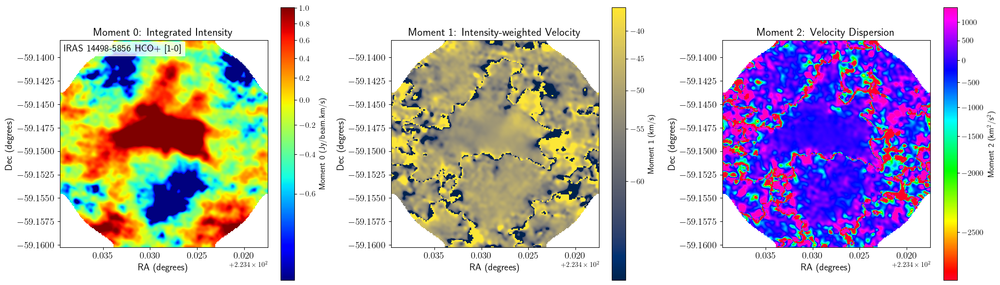

/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:178: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * (pix_cen - mom1) ** order, axis=axis) /


Plot saved to /home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2/IRAS 14498-5856 HCO+ [1-0] (blue)_moment_maps.pdf


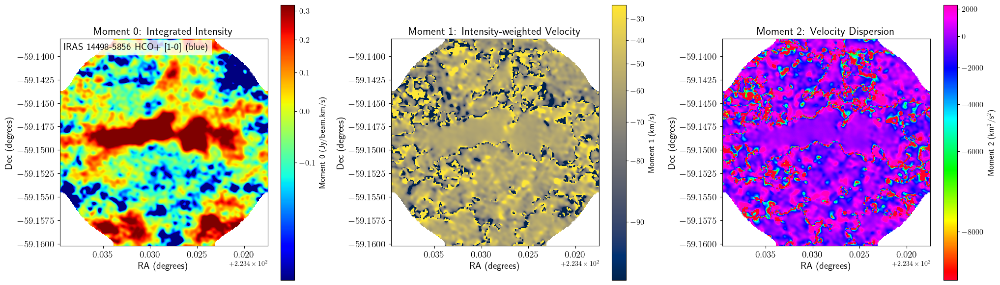

/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:178: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * (pix_cen - mom1) ** order, axis=axis) /


Plot saved to /home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2/IRAS 14498-5856 HCO+ [1-0] (red)_moment_maps.pdf


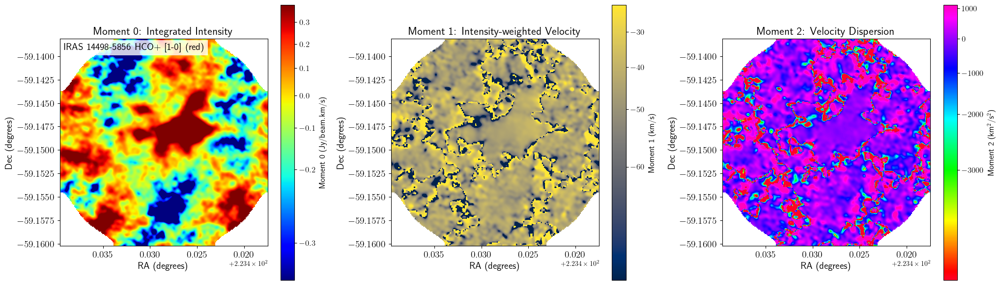

In [6]:
cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/IRAS 14498-5856 HCO+/IRAS 14498-5856 HCO+.fits')
SourceName = 'IRAS 14498-5856 HCO+ [1-0]'
plot_moment_maps(cube, SourceName)

cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/IRAS 14498-5856 HCO+/IRAS 14498-5856 HCO+_blue.fits')
SourceName = 'IRAS 14498-5856 HCO+ [1-0] (blue)'
plot_moment_maps(cube, SourceName)

cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/IRAS 14498-5856 HCO+/IRAS 14498-5856 HCO+_red.fits')
SourceName = 'IRAS 14498-5856 HCO+ [1-0] (red)'
plot_moment_maps(cube, SourceName)

# I16060 HCO+ (1-0)

/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:178: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * (pix_cen - mom1) ** order, axis=axis) /


Plot saved to /home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2/IRAS 16060-5146 HCO+ [1-0]_moment_maps.pdf


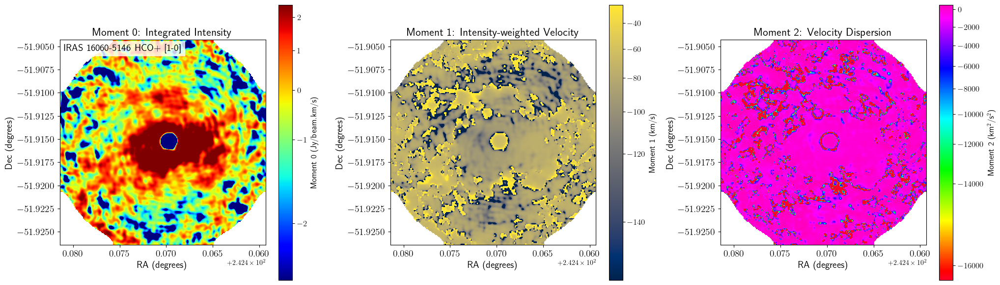

/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:178: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * (pix_cen - mom1) ** order, axis=axis) /


Plot saved to /home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2/IRAS 16060-5146 HCO+ [1-0] (blue)_moment_maps.pdf


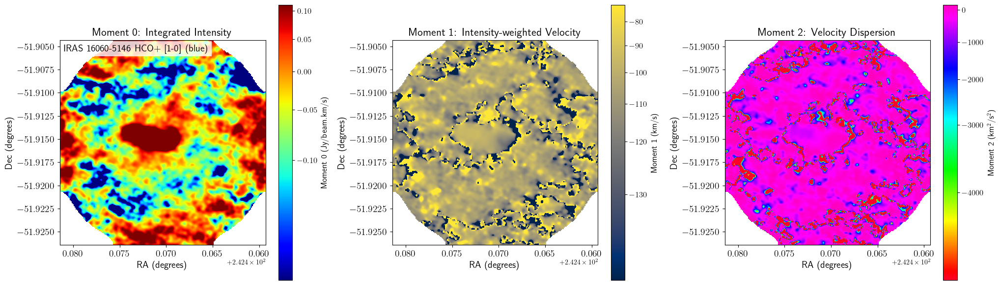

/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:168: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * pix_cen, axis=axis) /
/home/sanjana/miniconda3/lib/python3.12/site-packages/spectral_cube/_moments.py:178: RuntimeWarning: invalid value encountered in divide
  return (np.nansum(data * (pix_cen - mom1) ** order, axis=axis) /


Plot saved to /home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs_2/IRAS 16060-5146 HCO+ [1-0] (red)_moment_maps.pdf


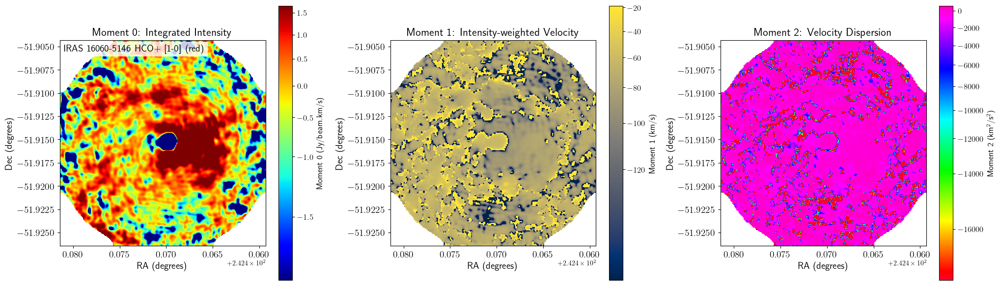

In [7]:
cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/IRAS 16060-5146 HCO+/IRAS 16060-5146 HCO+.fits')
SourceName = 'IRAS 16060-5146 HCO+ [1-0]'
plot_moment_maps(cube, SourceName)

cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/IRAS 16060-5146 HCO+/IRAS 16060-5146 HCO+_blue.fits')
SourceName = 'IRAS 16060-5146 HCO+ [1-0] (blue)'
plot_moment_maps(cube, SourceName)

cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/IRAS 16060-5146 HCO+/IRAS 16060-5146 HCO+_red.fits')
SourceName = 'IRAS 16060-5146 HCO+ [1-0] (red)'
plot_moment_maps(cube, SourceName)

# I14498 HCO+ (4-3)

# I16060 HCO+ (4-3)

## RA Dec Pixel Version

In [8]:
def plot_moment_maps(cube, SourceName, base_path='/home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs'):
    """
    Generate and plot moment maps for the given SpectralCube.
    
    Parameters:
    cube (SpectralCube): A SpectralCube object to generate moment maps from.
    SourceName (str): Name of the source to be used in the filename and directory.
    base_path (str): Base directory path where the plot will be saved.
    """
    # Calculate moment maps
    moment0 = cube.moment(order=0)
    moment1 = cube.moment(order=1)
    moment2 = cube.moment(order=2)

    moment2 = moment2 / 1000

    # Create a figure with 1 row and 3 columns
    fig, axes = plt.subplots(1, 3, figsize=(20.5, 6))  # Increase figure size for larger images

    # Plot Moment 0
    norm0 = simple_norm(moment0, 'sqrt', percent=85)
    im0 = axes[0].imshow(moment0.value, origin='lower', cmap='jet', norm=norm0)
    axes[0].set_title('Moment 0: Integrated Intensity', fontsize=16)
    axes[0].set_xlabel('RA Pixel', fontsize=14)
    axes[0].set_ylabel('Dec Pixel', fontsize=14)
    axes[0].tick_params(axis='both', labelsize=14)
    cbar0 = fig.colorbar(im0, ax=axes[0])  # Adjust colorbar size
    cbar0.ax.tick_params(labelsize=12)  # Increase font size of colorbar ticks

    # Add SourceName text to the upper left of Moment 0 plot
    axes[0].text(0.02, 0.98, SourceName, transform=axes[0].transAxes, 
                 fontsize=14, verticalalignment='top', horizontalalignment='left', 
                 bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

    # Plot Moment 1
    norm1 = simple_norm(moment1, 'sqrt', percent=85)
    im1 = axes[1].imshow(moment1.value, origin='lower', cmap='cividis', norm=norm1)
    axes[1].set_title('Moment 1: Intensity-weighted Velocity', fontsize=16)
    axes[1].set_xlabel('RA Pixel', fontsize=14)
    axes[1].set_ylabel('Dec Pixel', fontsize=14)
    axes[1].tick_params(axis='both', labelsize=14)
    cbar1 = fig.colorbar(im1, ax=axes[1])  # Adjust colorbar size
    cbar1.ax.tick_params(labelsize=12)  # Increase font size of colorbar ticks

    # Plot Moment 2
    norm2 = simple_norm(moment2, 'sqrt', percent=85)
    im2 = axes[2].imshow(moment2.value, origin='lower', cmap='gist_rainbow', norm=norm2)
    axes[2].set_title('Moment 2: Velocity Dispersion', fontsize=16)
    axes[2].set_xlabel('RA Pixel', fontsize=14)
    axes[2].set_ylabel('Dec Pixel', fontsize=14)
    axes[2].tick_params(axis='both', labelsize=14)
    cbar2 = fig.colorbar(im2, ax=axes[2])  # Adjust colorbar size
    cbar2.ax.tick_params(labelsize=12)  # Increase font size of colorbar ticks

    plt.tight_layout()

    # Construct save path
    save_dir = os.path.join(base_path, SourceName)
    os.makedirs(save_dir, exist_ok=True)  # Create directory if it doesn't exist
    save_file = os.path.join(save_dir, 'moment_maps.pdf')

    # Save or show plot
    plt.savefig(save_file, bbox_inches='tight')  # Save plot to specified path
    print(f"Plot saved to {save_file}")
    plt.show()  # Display plot

# OTHER TRIES

In [ ]:
from astropy.visualization import simple_norm
from astropy.io import fits
from spectral_cube import SpectralCube
from regions import PixCoord, CirclePixelRegion, EllipsePixelRegion
import matplotlib.pyplot as plt
import os

def parse_ds9_reg_file(reg_file):
    with open(reg_file, 'r') as f:
        lines = f.readlines()

    shape_params = None
    shape_type = None

    for line in lines:
        line = line.strip()
        if line.startswith('ellipse'):
            shape_type = 'ellipse'
            params_str = line.split('(')[1].split(')')[0]
            shape_params = [float(param) for param in params_str.split(',')]
        elif line.startswith('circle'):
            shape_type = 'circle'
            params_str = line.split('(')[1].split(')')[0]
            shape_params = [float(param) for param in params_str.split(',')]

    if shape_params is None:
        raise ValueError("No recognized shape found in the region file.")

    return shape_type, shape_params

def calculate_bounds(shape_type, shape_params):
    if shape_type == 'ellipse':
        center_x = shape_params[0]
        center_y = shape_params[1]
        semi_major_axis = shape_params[2]
        semi_minor_axis = shape_params[3]

        xmin = center_x - semi_major_axis
        xmax = center_x + semi_major_axis
        ymin = center_y - semi_minor_axis
        ymax = center_y + semi_minor_axis
    elif shape_type == 'circle':
        center_x = shape_params[0]
        center_y = shape_params[1]
        radius = shape_params[2]

        xmin = center_x - radius
        xmax = center_x + radius
        ymin = center_y - radius
        ymax = center_y + radius
    else:
        raise ValueError("Unsupported shape type.")

    return int(xmin), int(xmax), int(ymin), int(ymax)

def plot_moment_maps(cube, SourceName, reg_file=None, base_path='/home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs'):
    """
    Generate and plot moment maps for the given SpectralCube.
    
    Parameters:
    cube (SpectralCube): A SpectralCube object to generate moment maps from.
    SourceName (str): Name of the source to be used in the filename and directory.
    reg_file (str): Path to the DS9 region file (optional).
    base_path (str): Base directory path where the plot will be saved.
    """
    # Calculate moment maps
    moment0 = cube.moment(order=0)
    moment1 = cube.moment(order=1)
    moment2 = cube.moment(order=2)

    # Create a figure with 1 row and 3 columns
    fig, axes = plt.subplots(1, 3, figsize=(20.5, 6))  # Increase figure size for larger images

    # Plot Moment 0
    norm0 = simple_norm(moment0, 'sqrt', percent=85)
    im0 = axes[0].imshow(moment0.value, origin='lower', cmap='jet', norm=norm0)
    axes[0].set_title('Moment 0: Integrated Intensity', fontsize=16)
    axes[0].set_xlabel('RA Pixel', fontsize=14)
    axes[0].set_ylabel('Dec Pixel', fontsize=14)
    axes[0].tick_params(axis='both', labelsize=14)
    cbar0 = fig.colorbar(im0, ax=axes[0])  # Adjust colorbar size
    cbar0.ax.tick_params(labelsize=12)  # Increase font size of colorbar ticks

    # Add SourceName text to the upper left of Moment 0 plot
    axes[0].text(0.02, 0.98, SourceName, transform=axes[0].transAxes, 
                 fontsize=14, verticalalignment='top', horizontalalignment='left', 
                 bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

    # Plot Moment 1
    norm1 = simple_norm(moment1, 'sqrt', percent=85)
    im1 = axes[1].imshow(moment1.value, origin='lower', cmap='cividis', norm=norm1)
    axes[1].set_title('Moment 1: Intensity-weighted Velocity', fontsize=16)
    axes[1].set_xlabel('RA Pixel', fontsize=14)
    axes[1].set_ylabel('Dec Pixel', fontsize=14)
    axes[1].tick_params(axis='both', labelsize=14)
    cbar1 = fig.colorbar(im1, ax=axes[1])  # Adjust colorbar size
    cbar1.ax.tick_params(labelsize=12)  # Increase font size of colorbar ticks

    # Plot Moment 2
    norm2 = simple_norm(moment2, 'sqrt', percent=85)
    im2 = axes[2].imshow(moment2.value, origin='lower', cmap='gist_rainbow', norm=norm2)
    axes[2].set_title('Moment 2: Velocity Dispersion', fontsize=16)
    axes[2].set_xlabel('RA Pixel', fontsize=14)
    axes[2].set_ylabel('Dec Pixel', fontsize=14)
    axes[2].tick_params(axis='both', labelsize=14)
    cbar2 = fig.colorbar(im2, ax=axes[2])  # Adjust colorbar size
    cbar2.ax.tick_params(labelsize=12)  # Increase font size of colorbar ticks

    if reg_file:
        # Parse DS9 region file
        shape_type, shape_params = parse_ds9_reg_file(reg_file)
        xmin, xmax, ymin, ymax = calculate_bounds(shape_type, shape_params)
        
        # Plot region on each moment map
        for ax in axes:
            if shape_type == 'circle':
                region = CirclePixelRegion(center=PixCoord(x=(xmin + xmax) / 2, y=(ymin + ymax) / 2), radius=(xmax - xmin) / 2)
            elif shape_type == 'ellipse':
                # Convert angle to scalar value in degrees
                angle = 0  # Replace with actual angle if available in the shape_params
                region = EllipsePixelRegion(center=PixCoord(x=(xmin + xmax) / 2, y=(ymin + ymax) / 2), 
                                             height=(ymax - ymin),  # This is the full height
                                             width=(xmax - xmin),  # This is the full width
                                             angle=angle)  # Scalar angle in degrees
            region.plot(ax=ax, color='green', lw=2.0)

    plt.tight_layout()

    # Construct save path
    save_dir = os.path.join(base_path, SourceName)
    os.makedirs(save_dir, exist_ok=True)  # Create directory if it doesn't exist
    save_file = os.path.join(save_dir, 'moment_maps.png')

    # Save or show plot
    plt.savefig(save_file, bbox_inches='tight')  # Save plot to specified path
    print(f"Plot saved to {save_file}")
    plt.show()  # Display plot
'''
# Example usage
cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/I16272_spw29_CO_PlusMinus_150.0kmps_1_ChAvg_VelStep_0.847kmps.fits')
SourceName = 'IRAS 14498-5856 CO'
reg_file = '/home/sanjana/academic++/schools_workshops_internships/SNBNCBS/ds9_14498_CO.reg'  # Replace with your region file path
plot_moment_maps(cube, SourceName, reg_file)
'''

In [ ]:
def plot_moment_maps(cube, SourceName, base_path='/home/sanjana/academic++/schools_workshops_internships/SNBNCBS/report_figs'):
    """
    Generate and plot moment maps for the given SpectralCube.
    
    Parameters:
    cube (SpectralCube): A SpectralCube object to generate moment maps from.
    SourceName (str): Name of the source to be used in the filename and directory.
    base_path (str): Base directory path where the plot will be saved.
    """
    # Calculate moment maps
    moment0 = cube.moment(order=0)
    moment1 = cube.moment(order=1)
    moment2 = cube.moment(order=2)

    # Retrieve WCS from cube
    wcs = cube.wcs

    # Example: Convert RA and Dec to pixel coordinates
    # Assuming you have RA and Dec from SIMBAD
    custom_simbad = Simbad()
    custom_simbad.add_votable_fields('coordinates')
    result = custom_simbad.query_object("IRAS 14498-5856")
    ra = result['RA'][0]
    dec = result['DEC'][0]
    print(ra,dec)
    coords = SkyCoord(ra, dec, unit=(u.deg, u.deg), frame='icrs')
    print(coords)
    ra_deg, dec_deg = coords.ra.deg, coords.dec.deg
    print(ra_deg, dec_deg)
    x, y,_ = wcs.all_world2pix(ra_deg, dec_deg, 0,0) ###############################################

    # Create a figure with 1 row and 3 columns
    fig, axes = plt.subplots(1, 3, figsize=(20.5, 6))  # Increase figure size for larger images

    # Plot Moment 0
    norm0 = simple_norm(moment0, 'sqrt', percent=85)
    im0 = axes[0].imshow(moment0.value, origin='lower', cmap='jet', norm=norm0)
    axes[0].set_title('Moment 0: Integrated Intensity', fontsize=16)
    axes[0].set_xlabel('RA (J2000)', fontsize=14)
    axes[0].set_ylabel('Dec (J2000)', fontsize=14)
    cbar0 = fig.colorbar(im0, ax=axes[0])  # Adjust colorbar size
    cbar0.ax.tick_params(labelsize=12)  # Increase font size of colorbar ticks

    # Add SourceName text and position annotation
    axes[0].text(0.02, 0.98, SourceName, transform=axes[0].transAxes, 
                 fontsize=14, verticalalignment='top', horizontalalignment='left', 
                 bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))
    axes[0].plot(x, y, 'ro', markersize=8)  # Example: Add red dot at x, y

    # Plot Moment 1
    norm1 = simple_norm(moment1, 'sqrt', percent=85)
    im1 = axes[1].imshow(moment1.value, origin='lower', cmap='cividis', norm=norm1)
    axes[1].set_title('Moment 1: Intensity-weighted Velocity', fontsize=16)
    axes[1].set_xlabel('RA (J2000)', fontsize=14)
    axes[1].set_ylabel('Dec (J2000)', fontsize=14)
    cbar1 = fig.colorbar(im1, ax=axes[1])  # Adjust colorbar size
    cbar1.ax.tick_params(labelsize=12)  # Increase font size of colorbar ticks

    # Plot Moment 2
    norm2 = simple_norm(moment2, 'sqrt', percent=85)
    im2 = axes[2].imshow(moment2.value, origin='lower', cmap='gist_rainbow', norm=norm2)
    axes[2].set_title('Moment 2: Velocity Dispersion', fontsize=16)
    axes[2].set_xlabel('RA (J2000)', fontsize=14)
    axes[2].set_ylabel('Dec (J2000)', fontsize=14)
    cbar2 = fig.colorbar(im2, ax=axes[2])  # Adjust colorbar size
    cbar2.ax.tick_params(labelsize=12)  # Increase font size of colorbar ticks

    plt.tight_layout()

    # Construct save path
    save_dir = os.path.join(base_path, SourceName)
    os.makedirs(save_dir, exist_ok=True)  # Create directory if it doesn't exist
    save_file = os.path.join(save_dir, 'moment_maps.png')

    # Save or show plot
    plt.savefig(save_file, bbox_inches='tight')  # Save plot to specified path
    print(f"Plot saved to {save_file}")
    plt.show()  # Display plot

# Example usage
cube = SpectralCube.read('/media/sanjana/One Touch/Toolkit/OutflowProject/ALMAData/I16272_spw29_CO_PlusMinus_150.0kmps_1_ChAvg_VelStep_0.847kmps.fits')
SourceName = 'IRAS 14498-5856 CO'
plot_moment_maps(cube, SourceName)
